# Phase and orientation identification using vector-pair correlation functions

## Introduction
This notebook introduces the use of the vector pair correlation function (vPCF) as a tool for the identifcation of material phase and orientation in atomically-resolved scanning transmission electron microscopy (STEM) images. As an example it uses HfO<sub>2</sub>, since this material has many phases which may simultaneously coexist in a single sample. 

## The vPCF
A vPCF is a generalization of the well-known radial pair correlation function, which preserves information about the orientation of atomic columns relative to one another (as opposed to only distance information in the rPCF), as described by [Funni et al. (APL Materials, 2021)](https://doi.org/10.1063/5.0058928), and is defined by the equation:
$$
g(\vec{r}) = \frac{\rho(\vec{r})}{\rho_0} = \frac{1}{\rho_0N} \sum_v \sum_u \delta(\vec{r}-\vec{r}_{uv})
$$
where $\rho(\vec{r})$ and $\rho_0$ are the local (for some position $\vec{r}$) and average atomic density respectively, $N$ is the number of columns, $u$ and $v$ are used to index atomic columns, and $\delta$ is the [Dirac delta function](https://en.wikipedia.org/wiki/Dirac_delta_function). This function can be computed directly from the fitted atomic column positions in a STEM image, and the result $g(\vec{r})$ is a 2D histogram of column-column separations (distances and angles) in real space. The distribution and relative intensities of the peaks can give a lot of information about the local structure in the materials. However, for simplicity, the identification of the phase and orientation in this notebook is carried out ignoring the relative intensity of the vPCF intensities, using only the vector distributions as described in detail in this notebook. 

***

Let's start by importing the necessary libraries and creating some useful functions to simplify the notebook's flow.
For now, you can ignore these functions. Once you are more familiar with the code, you can modify the parameters in these functions for plotting and calculating, depending on your needs.

In [1]:
import numpy as np
from pathlib import Path
from tqdm.notebook import tqdm
from rsciio import digitalmicrograph
import matplotlib.pyplot as plt
from vpcffit.utils import select_files, save_vpcfs, load_vpcfs, xy_to_rt, rt_to_xy, create_zone_axes
from vpcffit.vpcffit import get_vpcf_from_cif, get_vpcf_from_cif2, align_point_clouds 
from vpcffit.vpcffit import supercell_axis_cif, get_image_from_atoms, create_vpcfs_images
from ase.visualize import view
import os
#%matplotlib inline

In [2]:
import plotly.graph_objects as go
import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interact, HBox, VBox
from vpcffit.vpcffit import align_point_clouds, near_neighbor_distance, crop_at_position
from scipy.ndimage import rotate
from joblib import Parallel, delayed
import copy
import atomap.api as am
import hyperspy.api as hs
from scipy.optimize import minimize

#A function to create an interactive plot to compare two vPCFs
def compare_vpcfs(vpcf1, vpcf2, fix_zone = False, limit = 500, names = ["vpcf1","vpcf2"], colors = ['red', 'blue'], markersize = [6,4]):
    
    vPCF = go.Scatterpolar(theta=[0], r=[0], mode='markers', name='vPCF1',
                            marker = dict(color=colors[0], size=markersize[0]))
    vPCF2 = go.Scatterpolar(theta=[0], r=[0], mode='markers', name='vPCF2',
                                marker = dict(color=colors[1], size=markersize[1]))
    
    fig = go.FigureWidget(data=[vPCF, vPCF2])
    
    # Create a function to update the plot
    def update_plot(phase, phase2):
        if fix_zone:
            vpc1 = vpcf1[phase][(np.sqrt(vpcf1[phase][:,0]**2+vpcf1[phase][:,1]**2)<limit)]
            vpc2 = vpcf2[phase][(np.sqrt(vpcf2[phase][:,0]**2+vpcf2[phase][:,1]**2)<limit)]
            aligned = align_point_clouds(vpc1, vpc2)
            fig.data[0].name = names[0]
            fig.data[1].name = names[1]
        else:
            vpc1 = vpcf1[phase][(np.sqrt(vpcf1[phase][:,0]**2+vpcf1[phase][:,1]**2)<limit)]
            vpc2 = vpcf2[phase2][(np.sqrt(vpcf2[phase2][:,0]**2+vpcf2[phase2][:,1]**2)<limit)]
            aligned = align_point_clouds(vpc1, vpc2)
            fig.data[0].name = phase
            fig.data[1].name = phase2
        rt_data = xy_to_rt(aligned[1]) # align_point_clouds returns the reference vpcf in the second position of the list
        rt_data2 = xy_to_rt(aligned[0]) # align_point_clouds returns the target vpcf after rotation in the first position of the list
        fig.data[0].update(r=rt_data[:, 0], theta=rt_data[:, 1] * 180 / np.pi)
        fig.data[1].update(r=rt_data2[:, 0], theta=rt_data2[:, 1] * 180 / np.pi)
        fig.show()
    # Create a dropdown for selecting the plot type
    plot_dropdown = widgets.Dropdown(
        options=list(vpcf1.keys()),
        description="First vPCF:"
    )

    plot_dropdown_2 = widgets.Dropdown(
        options=list(vpcf2.keys()),
        description="Second vPCF:",
        disabled=fix_zone
    )

    fig.update_layout(
        #title="Select the vPCF to plot",
        width=800,  # Set the width to 800 pixels
        height=600,  # Set the height to 600 pixels
        polar=dict(radialaxis=dict(range=[0, limit],
                  showline=False,  # Show the radial axis lines
                  linewidth=1.5,    # Set the width of the radial axis lines
                  linecolor="black",  # Set the color of the radial axis lines
                  showticklabels=False,
                  ),
                  angularaxis=dict(
                          showline=True,  # Show the radial axis lines
                          linewidth=1.5,    # Set the width of the radial axis lines
                          linecolor="black"  # Set the color of the radial axis lines
                          ),
                  bgcolor="rgba(0,0,0,0)",# Transparent background for polar plot area
                          ),
        legend=dict(orientation="h",
                   xanchor="center",
                   x=0.5,                       
           ),
    )

    [interact(update_plot, phase=plot_dropdown, phase2=plot_dropdown_2)]

def compare_exp_library_plot(match_DB, target, keys, virtual_dic, atomic_models,exp_img, pixel_size, sigma = 3, save = False, file= None, model = 'Powell', mark_size=5):
    tree_values= match_DB[0]
    rotation = match_DB[1]
    bs = match_DB[2]
    sigma = match_DB[3]
    best_match_itree = np.argmin(tree_values)
    best_scale_match = bs[best_match_itree]
    best_rotation =  rotation[best_match_itree]
    best_match_pc = np.array(library_pcs[best_match_itree]) 
    
    sorted_tree_values, sorted_keys, sorted_sigma, sorted_bs, sorted_rotation = zip(*sorted(zip(tree_values, keys, sigma, bs, rotation)))
    
    #compare the arrays to see differences
    differences = np.abs(np.array(sorted_tree_values) - sorted_tree_values[0])
    combined_sigma = np.sqrt((sigma*np.array(sigma))**2 + (sigma*np.array(sorted_sigma[0]))**2)
    within_sigma = differences <= combined_sigma
    matches = np.where(within_sigma)[0]
    colorbar = ['#1f77b4'] * len(keys)
    best_match_tree = []
    for index in matches:
        colorbar[index] = 'pink'
        best_match_tree.append(sorted_keys[index])
    
    size_exp=min(exp_img.shape)
    exp_img=exp_img[0:size_exp,0:size_exp]
    # select and crop STEM images
    def images_com (rot, index):
        rotated_image = rotate(exp_img,-rot*180/np.pi, reshape=False)
        crop_size = int(min(exp_img.shape[0], exp_img.shape[1]) / np.sqrt(2))
        virtual_pixel = virtual_dic[keys[index]][1]
        virtual_size = int(crop_size*pixel_size/virtual_pixel)
        virtual = virtual_dic[keys[index]][0]
        size_virtual=min(virtual.shape)
        virtual=virtual[0:size_virtual,0:size_virtual]
        
        if virtual.shape[0] < virtual_size:
            crop_2 = int(virtual.shape[0]*virtual_pixel/pixel_size)
            rotated_image = crop_at_position(rotated_image,crop_2, crop_2, rotated_image.shape[0]//2,rotated_image.shape[1]//2)
        else:
            rotated_image = crop_at_position(rotated_image,crop_size, crop_size, rotated_image.shape[0]//2,rotated_image.shape[1]//2)
            virtual = crop_at_position(virtual,virtual_size, virtual_size, virtual.shape[0]//2,virtual.shape[1]//2)    
        model_over = atomic_models[keys[index]]
        unique_species = sorted(set(model_over.get_chemical_symbols()))
        coord_DB = {}
        for atom in unique_species:
                coord_DB[atom] = np.array([model_over.positions[i]
                                           for i, condition in enumerate(model_over.get_chemical_symbols())
                                           if condition==atom])[:,0:2]
                coord_DB[atom] = coord_DB[atom][(coord_DB[atom][:,1]/virtual_pixel) < virtual_size//3] / virtual_pixel
                coord_DB[atom] = coord_DB[atom][coord_DB[atom][:,0] < virtual_size//3]
        
        img = hs.signals.Signal2D(virtual)
        image_fit = am.get_atom_positions(img, pca=False, separation=7)
        sublattices = am.Sublattice(image_fit, image=img.data, fix_negative_values=True)
        points = sublattices.atom_positions[:, [1, 0]]
        
        def objective(translation, points1, points2):
            dx, dy = translation  # Translation in x and y
            translated_points1 = points1 + np.array([dx, dy])
            distances = np.linalg.norm(translated_points1[:, None] - points2, axis=2)
            return np.sum(np.min(distances, axis=1))  # Sum of distances to nearest neighbors
        # Minimize the objective function
        result = minimize(objective, np.array([0, 0]), args=(points, coord_DB['Hf']), method=model)
        for key in coord_DB:
            coord_DB[key] -= result.x
        return rotated_image, virtual,virtual_size, coord_DB
    
    rotated_image, virtual, virtual_size,coord_DB = images_com (best_rotation, best_match_itree)
    #plot
    bar1 = go.Bar(
        x=sorted_keys,
        y=sorted_tree_values,
        marker_color = colorbar,
        text=[f"{num:.2f}   " for num in sorted_bs],         # Text on top of each bar
        textposition='outside',  # Position text above bars
        textangle=90,
        error_y = dict(
            type='data',           # Type of error, can also be 'percent' or 'constant'
            array=sigma,    # Error values for each bar
            #visible=True           # Display the error bars
        ),
        hovertemplate=(
                    '<b>Category:</b> %{x}<br>'  # Displays the x value (Category)
                    '<b>Value:</b> %{y}<br>'     # Displays the y value
                    '<b>scale:</b> %{text}'  # Displays the error value
                    '<extra></extra>'  # Removes the default trace name
                )
        )
    #Plot the Virtual image from the dictionary provided initially showing best match
    virtual = go.Heatmap(
    z=-virtual,
    colorscale="Greys",
    showscale=False
    )
    #Plot all sublattices from the model initially showing best match
    fig4 = go.FigureWidget()
    # Loop through the data to add scatter plots for each group
    for key in coord_DB:
        fig4.add_trace(go.Scatter(
            x=coord_DB[key][:,1],
            y=coord_DB[key][:,0],
            mode='markers',  # Use 'markers+lines' for both
            name=key,  # Legend entry
            marker=dict(
            size=5  # Set marker size
            )
        ))
    #Plot experimental STEM image
    experiment = go.Heatmap(
    z=-rotated_image,
    colorscale="Greys",
    showscale=False
    )
    
    # vPCF initially showing Experimental data
    vPCF1 = go.Scatterpolar(theta=np.mod(xy_to_rt(target)[:,1] + best_rotation,2*np.pi)*180/np.pi,
                            r=xy_to_rt(target)[:,0]*best_scale_match,
                            mode='markers', 
                            name='Experimental<br>vPCFs',
                            marker=dict(color='blue', size=mark_size))
    
    # vPCF initially showing best match
    vPCF2 = go.Scatterpolar(theta=xy_to_rt(best_match_pc)[:,1]*180/np.pi,
                            r=xy_to_rt(best_match_pc)[:,0],
                            mode='markers',
                            name="Best Matches<br>" + str(best_match_tree),
                            marker = dict(color='red', size=mark_size-int(mark_size/2)))
    
    fig = go.FigureWidget(data=[bar1])
    fig1 = go.FigureWidget(data=[virtual])
    fig2 = go.FigureWidget(data=[experiment])
    fig3 = go.FigureWidget(data=[vPCF1, vPCF2])
    for trace in fig4.data:
        fig1.add_trace(trace)
    
    # Customize layout
    fig.update_layout(
        height=400, width=800,
        showlegend=False,
        title = "Average Near Neighbor Distance",
        xaxis=dict(tickangle=90),  # Rotate x-axis labels
        xaxis2=dict(tickangle=90),
        hovermode="closest",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="left",
            x=0
        )
    )
    fig1.update_layout(
        height=400, width=400,
        title = "Simulated Image",
        xaxis=dict(
        #range=[0, virtual_size],
        tickvals=[],  # No ticks
        ticktext=[]   # No tick labels
        ),
        yaxis=dict(
        #range=[0, virtual_size],
        tickvals=[],
        ticktext=[]
        ),
        legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="left",
        x=0
        )
    )
    fig2.update_layout(
        height=400, width=400,
        title = "Experimental image",
        xaxis=dict(
        tickvals=[],  # No ticks
        ticktext=[]   # No tick labels
    ),
    yaxis=dict(
        tickvals=[],
        ticktext=[]
    )
    )
    
    fig3.update_layout(height=400, width=400,
                       legend=dict(
                                    orientation="h",
                                    yanchor="bottom",
                                    y=1.02,
                                    xanchor="left",
                                    x=0
                                    ),
                        polar=dict(radialaxis=dict(range=[0, limit],
                              showline=False,  # Show the radial axis lines
                              linewidth=1.5,    # Set the width of the radial axis lines
                              linecolor="black",  # Set the color of the radial axis lines
                              showticklabels=False,
                              showgrid=True,  # Turn on the radial grid
                              gridcolor="grey",  # Color of the radial grid
                              griddash="dot",  # Style of the radial grid (solid, dot, dash)
                              gridwidth=1  # Thickness of the grid line
                              ),
                              angularaxis=dict(
                                      showline=True,  # Show the radial axis lines
                                      linewidth=1.5,    # Set the width of the radial axis lines
                                      linecolor="black"  # Set the color of the radial axis lines
                                      ),
                              bgcolor="rgba(0,0,0,0)",# Transparent background for polar plot area
                                      ),
    )
    
    def onclick_fn(trace, points, state):
        inds = np.array(points.point_inds)
        if inds.size:
            vPCFs2.name = str(points.xs)
            index = keys.index(vPCFs2.name[2:-2])
            vPCFs1.r = xy_to_rt(target)[:,0]*bs[index]
            vPCFs1.theta = np.mod(xy_to_rt(target)[:,1]+rotation[index],2*np.pi)*180/np.pi
            vPCFs2.r = xy_to_rt(library_pcs[index])[:,0]
            vPCFs2.theta = xy_to_rt(library_pcs[index])[:,1]*180/np.pi
            rotated_image, virtual, virtual_size, coord_DB = images_com (rotation[index], index)
            vir.z = - virtual
            exp.z = - rotated_image
            for i, key in enumerate(coord_DB):
                fig1.data[i+1].x = coord_DB[key][:,1]
                fig1.data[i+1].y = coord_DB[key][:,0]
    
    bar1 = fig.data[0]
    vir = fig1.data[0]
    exp = fig2.data[0]
    vPCFs1 = fig3.data[0]
    vPCFs2 = fig3.data[1]
    bar1.on_click(onclick_fn)
    
    # ipywidgets
    from ipywidgets import HBox, VBox, Button
    if save:
        fig.write_html(file+"_bar_plot.html")
        fig3.write_html(file+"_vPCFs.html")
        fig1.write_html(file+"_MODEL.html")
        fig2.write_html(file+"_EXP.html")
    display(HBox([VBox([HBox([fig1, fig2]),fig]),fig3]))
    
def split_at_x_underscore(s, x = 2):
    # Split the string at underscores, with a maximum of 2 splits
    parts = s.split('_', x)

    # Check if there are at least three parts after splitting
    if len(parts) > x:
        first_part = '_'.join(parts[:x])
        second_part = parts[x]
        return first_part, second_part
    else:
        return s, ''

# The two functions in this code block are used to add noise to an image: the first add poisson noise, and the second adds scan-line jitter

def add_poisson_noise(img: np.ndarray, px_size: float=0.01, dose: float=1e6) -> np.ndarray:
    valmin, valmax = np.min(img), np.max(img)
    normed = (img - valmin) / (valmax - valmin)
    e_per_px = dose * px_size**2
    return np.random.poisson(normed * e_per_px)


def add_scan_noise(img: np.ndarray, shift_mag: int=4) -> np.ndarray:
    working = img.copy()
    for rownum in range(working.shape[0]):
        rowshift = np.random.randint(-shift_mag, shift_mag+1)
        working[rownum] = np.roll(img[rownum], rowshift)
    return working

def parallel_processing(bounds, target, pc, r_limit, nnd = 'ANND', mask_size = 10, **kwargs):
    bf_tree = []
    bf_scale = []

    # Function to process items in parallel
    def process_item(sc):
        return (near_neighbor_distance(target, pc, 
                                       nnd=nnd, 
                                       r_limit = r_limit,
                                       scale = sc/1000,
                                       mask_size = mask_size, **kwargs)[1],sc / 1000)

    # Parallel processing with joblib
    results = Parallel(n_jobs=-1)(delayed(process_item)(sc) for sc in range(bounds[0], bounds[1] + bounds[2], bounds[2]))

    # Split results into bf_tree and bf_scale
    for result, scale in results:
        bf_tree.append(result)
        bf_scale.append(scale)

    return bf_tree, bf_scale

# Function to handle each item in list_of_pcs
def parallel_process_pc(pc, target, bounds, r_limit, nnd = 'ANND', mask_size = 10, **kwargs):
    # Perform parallel processing on bf_tree and bf_scale
    bf_tree, bf_scale = parallel_processing(bounds, target, pc, r_limit, nnd)

    # Find best scale and compute ANN
    best_tree = np.argmin(bf_tree)
    best_scale = bf_scale[best_tree]


    # Calculate the rotation and align the two point clouds
    ANN = near_neighbor_distance(target, pc,
                                 nnd=nnd,
                                 r_limit = r_limit,
                                 scale = best_scale,
                                 mask_size = 10,
                                 **kwargs
                                 )

    aligned_pc, compared_pc, rotation_value = ANN[0]
    tree_value = ANN[1]
    sigma_value = ANN[2]

    return rotation_value, tree_value, best_scale, sigma_value, aligned_pc, compared_pc

# Reference vPCF Library Generation
We need to generate a reference library to match experimental vPCFs and identify the phase and orientation. For that, we show **three different methodologies**, as follows:

1. Using **`.cif` files** to project a structure along a desired zone axis and generate a vPCF from the location of the projected atomic positions, for selected elements.
   
2. Using `.cif` files to project a structure along a desired zone axis and convolve it with a Gaussian function. This **creates a projected image** that can account for microscope resolution and near-neighbor atomic columns that have overlapping signals. Then, the atomic column positions are located fitting 2D Gaussian functions. These atomic positions are then use to generate a vPCF. These additional steps make the process slower than generating the vPCFs directly from a `.cif` file, but more accurate due to the limited resolution of HAADF images.

3. Generating a vPCF from STEM **simulated images**, but fitting the atomic columns using 2D Gaussians functions and using the atomic-colum positions for the vPCFs. This is the most accurate methodologies among the three presented, however, the slowest when taking into consideration the time necessary to run the STEM image simulation.

At the end, we also show how they can be saved to disk and reloaded later, to avoid recomputing them each time.

## METHOD 1: From cif files
The next few cells demonstrate the generation of a library of vPCFs from a collection of `.cif` files. Each file describes a different polymorph of HfO$_2$. We load all `.cif` files, project each one along several zone axes, and generate each reference vPCFs. 

In [3]:
# %% Open .cif files for each relevant phase

# Default .cif files
file_list = [Path.cwd()/fname for fname in ["cif/Monoclinic.cif", "cif/Ortho-Pbca.cif", "cif/Ortho-Pca21.cif", "cif/Rhombo-R3.cif", "cif/Tetragonal.cif", "cif/Rhombo-R3m.cif"]]

# Uncomment and run this line instead of the above if you've moved the .cif files or want to load your own:
# file_list = [Path(file) for file in select_files(filetypes=[("Crystallographic Information File", ".cif")])]

print([f"{i}: {f.stem}" for i, f in enumerate(file_list)])
file_list = [file_list[i] for i in [4, 0, 2, 1, 3, 5]]
print([f"{i}: {f.stem}" for i, f in enumerate(file_list)])

['0: Monoclinic', '1: Ortho-Pbca', '2: Ortho-Pca21', '3: Rhombo-R3', '4: Tetragonal', '5: Rhombo-R3m']
['0: Tetragonal', '1: Monoclinic', '2: Ortho-Pca21', '3: Ortho-Pbca', '4: Rhombo-R3', '5: Rhombo-R3m']


Now that we've loaded our `.cif` files we need to project them and calculate their vPCFs. First, set the element label for your site of interest (Hf, in this case). For now, when specifying `element_of_interest` you should only choose one element; in theory this technique can be extended to look at vPCFs between elements that sit on different crystallographic sites, but that has not been implemented.

In [4]:
# Generate vPCF coordinates for the perfect structures
element_of_interest: str = "Hf"

We need to define the zone axis along which to project the unit cell. This must be given in Miller indices: Miller-Bravais indices for hexagonal systems are not supported. We've selected h,k,l =< 2 zone axes here. You can specify the zone axes manually or use the create_zone_axes function to specify the unique zone axes for a space group in the cif file.

In [ ]:
# Skip this cell if you will generate the zone axes automatically
common_zones = [(0, 0, 1), (0, 1, 0), (1, 0, 0), (1, 0, 1), (1, 1, 0), (0, 1, 1), (1, 1, 1)]

zones_manual: dict[str, list] = {"Monoclinic": common_zones,
                          "Ortho-Pca21": common_zones,
                          "Tetragonal": common_zones,
                          "Rhombohedral": common_zones,  
                          "Ortho-Pbca": common_zones[:4] + [(2, 1, 0),  # Swap out the last three zone axes for Pbca to be comparable to Pca21
                                                            (0, 1, 2),
                                                            (2, 1, 2),]
                          } # you can add projection by + [(h, k ,l)]

In [5]:
#Authomatically generate the list of zone axes with max_index = integer
max_index = 2
zones={}
zone_num = 0# help plotting
for cif in file_list:
    zones[cif.stem]= create_zone_axes(max_index,cif)

12 unique zone axes for space group: P 42/n m c
29 unique zone axes for space group: P 21/c
33 unique zone axes for space group: P c a 21
19 unique zone axes for space group: P b c a
36 unique zone axes for space group: R 3
27 unique zone axes for space group: R 3 m


We will now use **`get_vpcf_from_cif`** to generate the vPCFs from each phase and zone axis. The results are stored in a dictionary with keys of the form **'ciffilename_hkl'**. Some key parameters in the function are:

1. **e**: the element_of_interest selected before (e.i Hf).

2. **px_size**: This is the pixel size of the pair correlation function. It is important to use the same pixel size for creating the vPCF reference library and the experimental vPCFs. This pixel size is different from the image pixel size. These two pixel sizes are independent.

3. **gauss_sigma**: This blur the final vPCF to merge nearby peaks.

In [ ]:
vPCF_cif = {}  # Mapping from name (phase & orientation) to corresponding vPCF coordinate lists
for mapping in tqdm([(name, axes) for name in file_list for axes in zones[name.stem]],
                    desc="Generating refernce vPCFs", unit="vPCF"):
    newkey = mapping[0].stem + "_" + str(mapping[1][0])+str(mapping[1][1])+str(mapping[1][2])  # Names of the form 'ciffilename_hkl'

    vPCF_cif[newkey] = get_vpcf_from_cif(mapping[0], mapping[1], e=element_of_interest, guass_sigma = 3, px_size= 0.02)

The vPCFs are natively calculated in cartesian coordinates. When you need the peak positions in polar coordinates, which makes it simpler to perform the rigid rotation and scaling operations, they can be transformed with the `xy_to_rt` function defined in `utils`.

In the following cell you can browse through the computed vPCFs to visually compare them with one another. You can see that some of the vPCFs _appear_ to be indistinguishable by eye but do have meaningful differences, and some are wildly different from all the others.

Let's compare the vPCF of different phases and orientations. After running the following cell, you can select from the droplists `First vPCF` and `Second vPCF` to plot them together. The function `compare_vpcfs` finds the best rotation for comparing the two vPCFs using the function `align_point_clouds` from `vpcffit`. This function uses a binarization of the vPCF and cross-correlation to align them. See the documentation for more details.

In [ ]:
compare_vpcfs(vPCF_cif, vPCF_cif)

## METHOD 2: From Projected Images Generated from CIF files
Next, we generate the library of vPCFs from a collection of `.cif` by creating virtual images of projected structures. In this particular case, we convolve the protected structure with a Gaussian probe to consider the limited resolution of experimental HAADF images. The size of the probe must be given in Å and indicate the sigma (σ) of the gaussian function. If you are more familiar with the probe size in FWHM = 2.35σ. 

Similarly to the previous function, we create a dictionary of images for each `.cif` and zone axes. Then, two dictionaries are created containing the images and vPCF for each phase and orientation. The key of the dictionary maintains the form **'ciffilename_hkl'**, as previously used. 

In [56]:
vPCF_images_cif = {} 
lattices_images_cif = {} 
images_from_cif = {}
models_from_cif = {}
for mapping in tqdm([(name, axes) for name in file_list for axes in zones[name.stem]],
                    desc="Generating refernce vPCFs", unit="vPCF"):
    newkey = mapping[0].stem + "_" + str(mapping[1][0])+str(mapping[1][1])+str(mapping[1][2])    # Names of the form 'ciffilename_hkl'
    models_from_cif[newkey] = supercell_axis_cif(mapping[0], mapping[1])
    images_from_cif[newkey] = get_image_from_atoms(models_from_cif[newkey], 
                              atomic_specie = element_of_interest, 
                              probe_size = 0.55, 
                              px_size = 0.1, 
                              )
    images_fit = create_vpcfs_images(images_from_cif[newkey], vpcf_pixel_size=0.02, fit_atom_gaussian=True, method = 'gauss')
    vPCF_images_cif[newkey] = images_fit[1]
    lattices_images_cif[newkey] = images_fit[2]


Generating refernce vPCFs:   0%|          | 0/156 [00:00<?, ?vPCF/s]

WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated parameter standard deviations will be np.nan. (hyperspy.model:1411)
WARNING | Hyperspy | Covariance of the parameters could not be estimated. Estimated para

In [ ]:
compare_vpcfs(vPCF_images_cif, vPCF_images_cif)

We can also plot the generated project images. 

In [ ]:
num_phases = len(zones)
max_zone_axes = max(len(zone_axes) for zone_axes in zones.values())

fig, axes = plt.subplots(num_phases, max_zone_axes, figsize=(max_zone_axes * 3, num_phases * 3), dpi = 300)
# Flatten the axes array to make indexing easier
axes = axes.flatten() if num_phases > 1 else axes
for i, (phase, zone_axes) in enumerate(zones.items()):
    for j, zone in enumerate(zone_axes):
        newkey = phase + "_" + str(zone[0])+str(zone[1])+str(zone[2])    # Names of the form 'ciffilename_hkl'
        ax = axes[i * max_zone_axes + j]
        ax.imshow(-images_from_cif[newkey][0], cmap='Grays')
        ax.set_title(f"{phase}\n{str(zone[0])+str(zone[1])+str(zone[2])}", fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])
    # Hide any extra axes if the number of zone axes is less than the maximum
    for j in range(len(zone_axes), max_zone_axes):
        ax = axes[i * max_zone_axes + j]
        ax.axis('off')
plt.subplots_adjust(left=0.1, right=0.5, top=0.5, bottom=0)
plt.show()

In addition, we can compare Method 1 and Method 2 to see the key differences.

Ideal vPCFs, generated from CIF files, have additional peaks that cannot be obtained from vPCFs from images, due to their limited resolution. These vPCFs completely match, highlighting the importance of considering the limited resolution of the images when comparing the library with experimental images. A more accurate approach is to use simulated atomic resolution STEM images to generate the vPCFs, as shown in Method 3. 

In [ ]:
compare_vpcfs(vPCF_cif, vPCF_images_cif, fix_zone = True, names=['From Cif','From virtual images'])

## METHOD 3: From simulated STEM images

Instead of generating the vPCFs from the projected structures, we can generate the reference vPCFs from simulated STEM images. This method has the advantage of directly including the effects of probe aberrations and  propagation by including those effects in the image simulation. However, it does require you to simulate images of the structures of interest (along several zone axes). STEM image simulation is not covered here, but the python library [abTEM](https://abtem.readthedocs.io/en/latest/intro.html) and the GUI software [Dr. Probe](https://er-c.org/barthel/drprobe/), are both very well documented. For the sake of this example, we include a simple code to simulated HAADF images for each of the phases & orientations that we had above. 

If you perform simulations elsewhere, please skip the cell below and modify the the script to load your own images. 

In [ ]:
import dask
import numpy as np
import abtem
from pathlib import Path
from scipy.ndimage import gaussian_filter
from vpcffit.utils import create_zone_axes
from tqdm.notebook import tqdm
from vpcffit.vpcffit import supercell_axis_cif
import ase.io as aio

abtem.config.set({"device": "cpu"});
dask.config.set({"num_workers": 32});

models = {}
potential = {}
potential_image = {}
haadf_results = {}
interpolated_results = {}
for mapping in tqdm([(name, axes) for name in file_list for axes in zones[name.stem]],
                    desc="Generating refernce HAADF images", unit="image"):
    newkey = mapping[0].stem + "_" + str(mapping[1][0])+str(mapping[1][1])+str(mapping[1][2])    # Names of the form 'ciffilename_hkl'
    file_path= 'simulations/'+newkey+"_HAADF.zarr"
    #print(file_path)
    if os.path.exists(file_path):
        continue
    model = supercell_axis_cif(mapping[0], mapping[1], size = 40)
    sublattice = model[[atom.symbol == 'Hf' for atom in model]]
    #potential_image[newkey] = abtem.Potential(sublattice, sampling=0.1).project().compute().array
    models[newkey] = model
    potential[newkey] = abtem.Potential(model, sampling=0.045)
    probe = abtem.Probe(energy=200e3, semiangle_cutoff=18, Cs=10e4, defocus=0)
    probe.grid.match(potential[newkey])
    grid_scan = abtem.GridScan(
        start=[0, 0],
        end=[1, 1],
        sampling=probe.aperture.nyquist_sampling,
        fractional=True,
        potential=potential[newkey],
    )
    exit_waves_line = probe.multislice(potential[newkey], scan=grid_scan)
    haadf = abtem.AnnularDetector(inner=70, outer=180)
    haadf_measurement = probe.scan(potential[newkey], scan=grid_scan, detectors=haadf)
    haadf_results[newkey] = haadf_measurement.compute()
    interpolated_results[newkey] = haadf_results[newkey].interpolate(sampling=0.1)
    haadf_results[newkey].to_zarr(file_path)

Let's load the images and calculate the vPCFs.

In [6]:
import abtem
images = {}
models = {}
for mapping in tqdm([(name, axes) for name in file_list for axes in zones[name.stem]],
                    desc="Generating refernce HAADF images", unit="image"):
    newkey = mapping[0].stem + "_" + str(mapping[1][0])+str(mapping[1][1])+str(mapping[1][2])    # Names of the form 'ciffilename_hkl'
    models[newkey]= supercell_axis_cif(mapping[0], mapping[1], size = 40)
    file_path='simulations/'+newkey+"_HAADF.zarr"
    if not os.path.exists(file_path):
        print(f"⚠️ Warning: The path '{file_path}' does not exist!")
    #TODO: read the pixel size
    img = abtem.from_zarr(file_path).interpolate(sampling=0.1).gaussian_filter(0.5).array.compute()
    #add noise - You can skip the next two lines if you do not want to add noise
    #img = add_poisson_noise(img, px_size=0.01, dose=1e5)
    #img = add_scan_noise(img, shift_mag=3)
    images[newkey] = [img,0.1]

Generating refernce HAADF images:   0%|          | 0/156 [00:00<?, ?image/s]

Note that we maintain the vpcfs pixel size constant among the different methods to make the comparison straight forward. This point is also crucial for the experimental images. However, since the pixel size of the vPCF is (to xome extent) independent of the image pixel size, you do not need to collect the image at the same pixel size as the simulated images, the pixel size of the experimental image can be any value that allow the differenciation of the atomic columns. 

In [59]:
vPCFs = {}
for key in tqdm(images, desc="Generating refernce vPCFs", unit="vPCF"):
    vPCFs[key] = create_vpcfs_images(images[key], vpcf_pixel_size=0.02, fit_atom_gaussian=True, method = 'gauss')[1]

Generating refernce vPCFs:   0%|          | 0/156 [00:00<?, ?vPCF/s]

KeyboardInterrupt: 

We can plot the images and compare the vPCFs

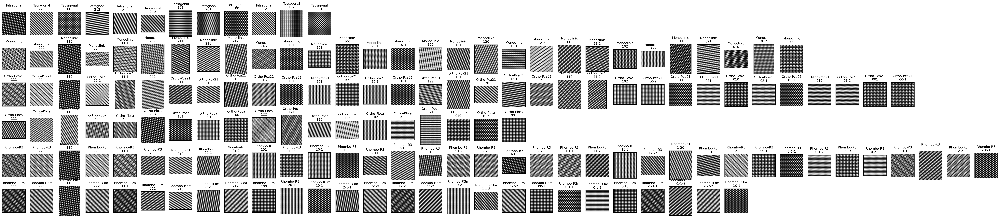

In [60]:
from vpcffit.vpcffit import crop_at_position
num_phases = len(zones)
max_zone_axes = max(len(zone_axes) for zone_axes in zones.values())
fig, axes = plt.subplots(num_phases, max_zone_axes, figsize=(max_zone_axes * 3, num_phases * 3), dpi = 300)
# Flatten the axes array to make indexing easier
axes = axes.flatten() if num_phases > 1 else axes
for i, (phase, zone_axes) in enumerate(zones.items()):
    for j, zone in enumerate(zone_axes):
        newkey = phase + "_" + str(zone[0])+str(zone[1])+str(zone[2])    # Names of the form 'ciffilename_hkl'
        ax = axes[i * max_zone_axes + j]
        ax.imshow(-images[newkey][0], cmap='Grays')
        ax.set_title(f"{phase}\n{str(zone[0])+str(zone[1])+str(zone[2])}", fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])
    # Hide any extra axes if the number of zone axes is less than the maximum
    for j in range(len(zone_axes), max_zone_axes):
        ax = axes[i * max_zone_axes + j]
        ax.axis('off')
plt.subplots_adjust(left=0.1, right=0.5, top=0.5, bottom=0)
plt.show()
fig.savefig('HAADF_Simulated_.png', dpi=300) 

In [57]:
compare_vpcfs(vPCFs, vPCFs)

NameError: name 'vPCFs' is not defined

Let's compare Method 2 and Methode 3 to see the key differences.

In [ ]:
#TODO: The list must be limited to the zone axes that are common for both methods. 
compare_vpcfs(vPCF_images_cif, vPCFs, fix_zone = True, limit = 500, names = ['Projected structure','Simulated images'])

Going through the different phases and orientations, it is evident that the projected structures images (Method 2) can - to some extent - produce a good approximation of the  calculated vPCF from STEM images. This approach can reduce the amount of time for the initial determination of phase and orientation. Which could be refined simulating only more ambiguous phases and orientations. 

# Saving and loading vPCF library

The next two cells demonstrate how to save and load the vPCFs to and from disk – especially useful when running a jupyter notebook, which may require the kernel to be restarted!

In [ ]:
# Save the vPCFs to disk
# Here we directly specify the file name and (relative) directory, but both of these are optional arguments
# If you specify neither or only one, an interactive save dialog will pop up (if one option is present it will be used as a default, but can be overwritten by user interaction)
# IMPORTANT: If you pass both arguments there will be no interactive dialog, and thus no overwrite confirmation!
#save_vpcfs(vPCF_cif, fname="HfO_vPCFs_from_cif_index1", directory="saved_vpcfs")
#save_vpcfs(vPCF_images_cif, fname="HfO_vPCFs_from_images_cif_maxIndex1", directory="saved_vpcfs")
save_vpcfs(vPCFs, fname="HfO_vPCFs_from_simulation_maxIndex2", directory="saved_vpcfs")

In [ ]:
loaded_vpcfs = load_vpcfs() # load_vpcfs returns a dictionary with a mapping from filename stems to the associated vpcf data
#loaded_vpcfs_noise = load_vpcfs()
if "vPCFs" in locals():  # If you got to this cell by running the earlier cells, we can compare the values in vPCFs to the loaded_structures to prove they're the same
    if all([(loaded_vpcfs[k] == v).all() for k, v in vPCFs.items()]):
        print("Loading succsessful!")
# From now on we will use the loaded_structures name so that it is easy to continue from this point if you need to reset the notebook kernel

# vPCF comparison

For the sake of higher accuracy, we use the vPCF calculated from STEM image simulations as a library of reference vPCF. 
To match a vPCF with one in the library, we are using pair-wise comparisons, where two vPCF are aligned using cross-correlation, as previously described,  allowing the target vPCFs (e.g. experimental) to scale isotropically to account for small miscalibration of the images, as well as variation between the experimental structure and the files used to create the library. Anisotropic strain is still not supported.
After the target vPCF is scale and rotated, the nearest neighbor distance (NND) for each point in the vPCF is calculated and the best match is selected as the minimum average NND (ANND) for the pair of vPCF. The users can also select the summed NND, which could be more appropriate in some cases when the large number of points in the vPCFs can affect the ANND. 

Let's plot all the vPCF in one graph.

In [ ]:
phases = {}
for key in tqdm(loaded_vpcfs):
    phase = split_at_x_underscore(key, x=1)[0]
    zone = split_at_x_underscore(key, x=1)[1]
    if phase not in phases:
        phases[phase] = []
    phases[phase].append(zone) 

In [ ]:
num_phases = len(phases)
max_zone_axes = max(len(zone_axes) for zone_axes in phases.values())
fig, axes = plt.subplots(num_phases, max_zone_axes, figsize=(max_zone_axes * 3, num_phases * 3), dpi = 300, subplot_kw={'projection': 'polar'})
# Flatten the axes array to make indexing easier
axes = axes.flatten() if num_phases > 1 else axes
for i, (phase, zone_axes) in enumerate(phases.items()):
    for j, zone in enumerate(zone_axes):
        newkey = phase + "_" + zone   # Names of the form 'ciffilename_hkl'
        ax = axes[i * max_zone_axes + j]
        peaks = xy_to_rt(loaded_vpcfs[newkey])
        ax.set_rlim(rmin=0, rmax=500)
        ax.set_yticklabels([])
        ax.set_thetagrids((0, 90, 180, 270), ("0", u"\u03c0/2", u"\u03c0", "3"+u"\u03c0/2"), fontsize=6)
        ax.tick_params(pad=-5)
        ax.scatter(peaks[:, 1], peaks[:, 0], s=5, c="orange")
        ax.set_title(f"{phase}\n{zone}", fontsize=10)
        ax.grid(False)
    # Hide any extra axes if the number of zone axes is less than the maximum
    for j in range(len(zone_axes), max_zone_axes):
        ax = axes[i * max_zone_axes + j]
        ax.axis('off')
plt.subplots_adjust(left=0.1, right=0.9, top=0.95, bottom=0)
plt.show()
fig.savefig('vPCFs_from_images_CIF.png', bbox_inches='tight', dpi=300) 

Now, we match the library to itself, to identify the phases and orientation that could show ambiguities that prevent their differentiation. First, we define `eval_DB` and `library_pcs` as the targets and reference libraries, respectively. We also define bounds for the scale, the bounds parameter takes a list of integers in units of <span style="color:red">(% x 10)</span>.

In [ ]:
eval_DB = loaded_vpcfs ## Select the database of vPCF as targets
library_DB = loaded_vpcfs ## Select the database of vPCF as a library
library_pcs = list(library_DB.values())
keys=list(library_DB.keys())
# Scaling bondaries
bounds = [950, 1050, 5] # define the scaling range allowed for the matching, in this example we are using a ± 5% scaling variation in steps of 0.5%

Considering that both libraries are identical, we rotate the target randomly and only then match it with the library. This step is unnecessary for experimental vPCFs or for dissimilar libraries (i.e. if you want to compare vPCF created from the simulated images and from the `.cif` files)

In [ ]:
import random
rotated_target = {}
limit = 500
for key, value in tqdm(eval_DB.items()):
    target_pc = xy_to_rt(eval_DB[key])
    rotated_theta = target_pc[:, 1] + random.randint(0, 360)*np.pi/180
    rotated_theta = np.mod(rotated_theta, 2*np.pi)
    target_pc[:, 1] = rotated_theta
    #target_pc = target_pc[target_pc[:, 0] < limit]
    rotated_target[key] = rt_to_xy(target_pc)

Now we use paralell processing to compare 35 x 35 vPCFs and generate a plot with the ANND for each comparison in a heatmap. All the information about the ANND, errors, the rotation and angle for each vPCF in the target vPCFs is stored in the dictionary `match_DB` as follows:

1. match_DB[`key`][0]: returns a list of ANND for the target vPCF in `key`, for every vPCF in the library_pcs.
   
2. match_DB[`key`][1]: returns a list of angles in which the target vPCF in `key` needs to be rotated to minimize the ANND. The rotation is from 0-360

3. match_DB[`key`][2]: returns a list of scales in which the target vPCF in `key` needs to be scaled to minimize the ANND, withing the bounds we stablished.

4. match_DB[`key`][3]: returns a list of the errors for every ANND in match_DB[`key`][0].

Note that this stape is time consuming and is not necessary for evaluating an experimental image. If you want to compare your experimental image you can skip the next lines and go directly to **Experimental vPCFs**

In [ ]:
match_DB = {}
for key, value in tqdm(rotated_target.items()):
    # Run in parallel for each pc in list_of_pcs
    results = Parallel(n_jobs=-1)(delayed(parallel_process_pc)(pc, value, bounds, r_limit = limit, nnd = 'ANND', mask_size = 15) for pc in library_pcs)

    # Unpack results
    tree_values, rotation, bs, sigma = [], [], [], []
    for rotation_value, tree_value, best_scale, sigma_value, aligned_pc, compared_pc in results:
        rotation.append(rotation_value)
        tree_values.append(tree_value)
        bs.append(best_scale)
        sigma.append(sigma_value)

    match_DB[key] = tree_values, rotation, bs, sigma # each matched experimental to the tree of library

To visualize the results, we use an interactive plot. The heatmap on the left indicates the ANND for a pair of vPCF in each pixel. The scatter plots in black and red, show the normilized ANND lower than 0.01 or between 0.01 and 0.05, respectively. You can activate and deactivate the scatter plots from their labels. The plot on the right is a polar representation of the vPCF, you can click on each pixel in the heatmap to replot the vPCF comparison in the polar scatterplot. 

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

existing_keys = []
inexisting_keys = []
for key, value in tqdm(match_DB.items()):
    index = next((i for i, s in enumerate(keys) if key in s), None)
    if index is not None:
        existing_keys.append(index)
    else:
        inexisting_keys.append(key)
        print(f"Phase {key} does not exists in the library. This phase will be ignored")
        

filtered_match_DB = dict(filter(lambda item: item[0] not in inexisting_keys, match_DB.items()))

array_size = len(existing_keys)
match_tree_fig =  np.empty((array_size,array_size))
rot_fig =  np.empty((array_size,array_size))
bs_fig =  np.empty((array_size,array_size))
sg_fig =  np.empty((array_size,array_size))
matches = np.empty((array_size,array_size))
best_values = np.empty((array_size,array_size))
labels= []
for index, (key, value) in enumerate(tqdm(filtered_match_DB.items())):
    if key in inexisting_keys:
        continue
    match_tree_fig [index] = np.array([value[0][i] for i in existing_keys if i < len(value[0])])
    rot_fig [index]  = np.array([value[1][i] for i in existing_keys if i < len(value[1])])#np.array(value[1])
    bs_fig [index]  = np.array([value[2][i] for i in existing_keys if i < len(value[2])])#np.array(value[2])
    sg_fig [index]  = np.array([value[3][i] for i in existing_keys if i < len(value[3])])#np.array(value[3])
    # significant differences
    best_value = np.argmin(match_tree_fig[index])
    differences = np.abs(match_tree_fig[index] - match_tree_fig[index][best_value])
    combined_sigma = np.sqrt(np.array(sg_fig[index])**2 + sg_fig[index][best_value]**2)
    within_sigma = differences <= 3*combined_sigma
    matches[index] = within_sigma
    best_values[index] = np.equal(match_tree_fig [index], match_tree_fig[index][best_value])
    labels.append(key)


y_matches, x_matches = np.where(matches)
y_best_values, x_best_values = np.where(best_values)

asymmetry = (match_tree_fig-match_tree_fig.T)/match_tree_fig.max()
match_tree = (match_tree_fig)/match_tree_fig.max()
sigma_tree = sg_fig/match_tree_fig.max()
print(asymmetry.max(),3*sigma_tree.max() )

for index, l in enumerate(labels):
    labels[index] = '['+split_at_x_underscore(l,1)[1]+']__'+split_at_x_underscore(l,1)[0][-1]
#comment this line to save fro publication ERRASE
labels = [f"{keys[i]}" for i in range(match_tree_fig.shape[0])]

# Define the range for marking pixels
value_min_1, value_max_1 = 0.0, 0.01
value_min_2, value_max_2 = 0.01, 3*sigma_tree.max()

# Find coordinates of pixels within the specified range for markers
y_coords1, x_coords1 = np.where((match_tree >= value_min_1) & (match_tree <= value_max_1))
y_coords2, x_coords2 = np.where((match_tree >= value_min_2) & (match_tree <= value_max_2))

heatmap1 = go.Heatmap(
    z=asymmetry,
    x=labels,
    y=labels,
    #opacity=0.5,
    colorscale="Plasma_r",
    colorbar=dict(title="Normalized Intensity",
                  title_side="right",
                 ),  # Adjust colorbar position),
            zmin=match_tree.min(), 
            zmax=match_tree.max(),
            customdata = sigma_tree,  # Pass the data from heatmap2 to heatmap1 using customdata
            hovertemplate="SNND: %{z:.3g} &#177; %{customdata:.1e}<br>Coordinates: (%{x}, %{y})<extra></extra>"  # Customize hover text for heatmap 1
)

best_match = go.Scatter(
    x=[labels[x] for x in x_best_values],
    y=[labels[y] for y in y_best_values],
    mode='markers',
    visible='legendonly',
    marker=dict(color='red', size=6),
    name=f"Best Match"
)
similarities = go.Scatter(
    x=[labels[x] for x in x_matches],
    y=[labels[y] for y in y_matches],
    mode='markers',
    visible='legendonly',
    marker=dict(color='blue', size=6),
    name=f"Indistinguishable"
)

vPCF1 = go.Scatterpolar(theta=[0], r=[0], mode='markers', name='vPCFs 1',
                        marker=dict(color='blue', size=8))
vPCF2 = go.Scatterpolar(theta=[0], r=[0], mode='markers', name='vPCFs 2',
                        marker = dict(color='red', size=6))

# fig = go.FigureWidget(data=[heatmap1,scatter1_black,scatter1_red, similarities])
fig = go.FigureWidget(data=[heatmap1,best_match,similarities])
fig2 = go.FigureWidget(data=[vPCF1, vPCF2])

# Customize layout
fig.update_layout(
    height=650, width=650,
    showlegend=True,
    title = "Average Near Neighbor Distance (ANND)",
    xaxis=dict(tickfont=dict(size=6), tickangle=-90),  # Rotate x-axis labels for both heatmaps
    yaxis=dict(tickfont=dict(size=6)),
    hovermode="closest",
    paper_bgcolor='rgba(0,0,0,0)',  # Makes the background outside the plot transparent
    plot_bgcolor='rgba(0,0,0,0)',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="left",
        x=0
    )
)
fig2.update_layout(title = "vPCF comparison after ANND minimization",
                   height=480, width=480,
                   polar=dict(radialaxis=dict(range=[0, limit],
                              showline=False,  # Show the radial axis lines
                              linewidth=1.5,    # Set the width of the radial axis lines
                              linecolor="black",  # Set the color of the radial axis lines
                              showticklabels=False,
                              ),
                              angularaxis=dict(
                              showline=True,  # Show the radial axis lines
                              linewidth=1.5,    # Set the width of the radial axis lines
                              linecolor="black"  # Set the color of the radial axis lines
                              ),
                              bgcolor="rgba(0,0,0,0)",# Transparent background for polar plot area
                              ),
                   legend=dict(orientation="h",
                               xanchor="center",
                               x=0.5,                       
                               ),
    
)

def onclick_fn(trace, points, state):
    inds = np.array(points.point_inds)
    if inds.size:
        vPCFs1.name = str(points.xs)
        vPCFs2.name = str(points.ys)
        key = vPCFs1.name[2:-2]
        index = keys.index(vPCFs2.name[2:-2])
        scale = match_DB[key][2]
        rotation = match_DB[key][1]
        vPCFs1.r = xy_to_rt(rotated_target[key])[:,0]*scale[index]
        vPCFs1.theta = np.mod(xy_to_rt(rotated_target[key])[:,1]+rotation[index],2*np.pi)*180/np.pi
        vPCFs2.r = xy_to_rt(library_pcs[index])[:,0]
        vPCFs2.theta = xy_to_rt(library_pcs[index])[:,1]*180/np.pi
        fig2.layout.title = "vPCF comparison after ANND minimization<br>Scale = "+str(scale[index])+" and rotation = "+ str(np.round(rotation[index]*180/np.pi,0))+"\u00b0"
scatt1 = fig.data[0]
vPCFs1 = fig2.data[0]
vPCFs2 = fig2.data[1]

scatt1.on_click(onclick_fn)

# ipywidgets
from ipywidgets import HBox, VBox, Button
fig.write_html("ANND_map_assymetry.html")
display(HBox([fig, fig2]))

A similar excersice can be done using two different library, for examples the one generated by creating virtual images from `.cif` files and the ones generated by simulated images, which can give quantitaive value of how approximated are the vPCFs.

# Experimental vPCFs 

The procedure used to calculate the library of vPCFs can also be used to generate the vPCF for experimental images, as follows:

Let's load an image. You can load the imgaes using any of the library available in python, just make sure the pixel size is in Å. We provide some experimental image to test the methodology. 

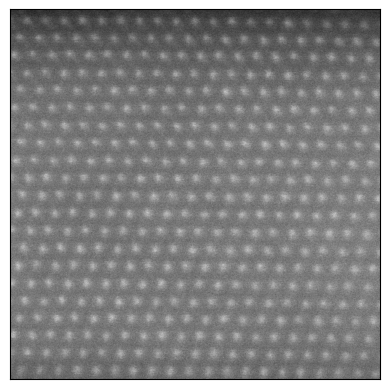

In [63]:
import SingleOrigin as so

#img_path = str(Path.cwd()/"img/Exp_HZO_R3_HAADF.dm3")

# Uncomment and run this line instead of the above if you want to load your own image:
img_path = select_files()[0]

image = so.load_image(
    path = img_path, 
    display_image = True,
    return_path = True,
    images_from_stack = 'all'
)
#Make sure that the pixel size is in Angstroms  
pixel_size = image[1]['pixelSize'][0]*10
image=image[0]#[0:292,0:292]

#image = add_poisson_noise(image, px_size=0.01, dose=1e4)
#image = add_scan_noise(image, shift_mag=4)

In [66]:
exp_vPCF = create_vpcfs_images((image,pixel_size), fit_atom_gaussian=True, method = 'gauss', blur_vpcf=5, separation=15, show_progressbar=True)

Center of mass:   0%|          | 0/404 [00:00<?, ?it/s]

Gaussian fitting:   0%|          | 0/404 [00:00<?, ?it/s]

Make sure you visualize the atomic column fitting by extracting the atomap lattice and plot the vPCF to make sure the peaks are correctly identify. You can modify the parameter (e.g. separation) to improve the fitting. Note that a few false positive or false negative atomic columns do not significantly affect the final result. Save the cartesian vPCF in a different variable.

Text(0.5, 1.0, 'vPCF')

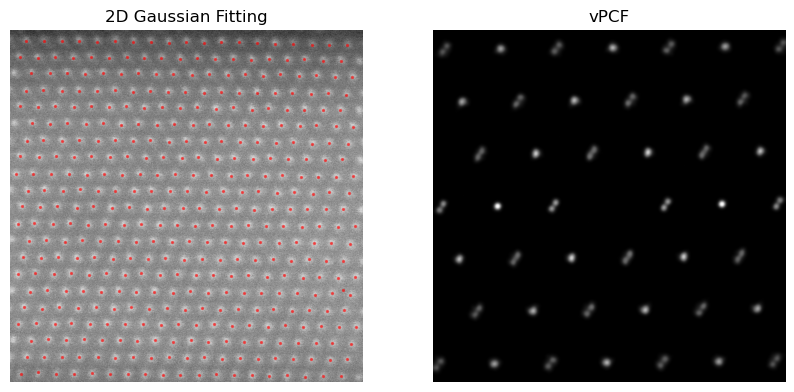

In [67]:
from matplotlib.gridspec import GridSpec

exp_vpcf = exp_vPCF[1]

# Create the GridSpec layout
fig = plt.figure(figsize=(10, 5))  # Set a suitable figure size
gs = GridSpec(1, 2, width_ratios=[1, 1], figure=fig)  # Create a 1-row, 2-column layout

# gaussina plot
ax1 = fig.add_subplot(gs[0])
ax1.scatter(exp_vPCF[2].x_position, exp_vPCF[2].y_position, c='red', s=2, alpha = 0.5)
ax1.imshow(-image, cmap ='Greys')
ax1.set_axis_off() 
ax1.set_title("2D Gaussian Fitting")

# vPCF plot
ax2 = fig.add_subplot(gs[1])
#ax2.scatter(exp_vPCF[1][:,1]+exp_vPCF[0][1][1], exp_vPCF[1][:,0]+exp_vPCF[0][1][0], marker = 'o', s=20, edgecolor='orange', facecolor ='none', linewidth=1, alpha = 0.5)
im = ax2.imshow(-exp_vPCF[0][0], cmap ='Greys')
ax2.set_axis_off()
ax2.set_title("vPCF")
#plt.savefig(Path(img_path[0]).stem+'Gaussian_fitting_vPCF.png', dpi=300) 

## Matching experimental vPCFs
Let's now match our vPCF to the library we created in previous steps. If you did not create the library in previous steps you can simply load one. 

In [54]:
loaded_vpcfs = load_vpcfs()

In [68]:
target = exp_vpcf
#target[:,1] = -exp_vpcf[:,1]
limit = 500 # try to minimize the number of extra spots in the vPCF when matching. Experimental or theoretical vPCF can have been calculated to larger r.
library_DB = loaded_vpcfs ## Select the database of vPCF as a library
library_pcs = list(library_DB.values())
keys=list(library_DB.keys())
bounds = [980,1020,5]

results = Parallel(n_jobs=-1)(delayed(parallel_process_pc)(pc, target, bounds, r_limit = limit,  nnd = 'ANND', mask_size =40, radial_pts= 200) for pc in library_pcs)

# Unpack results
tree_values, rotation, bs, sigma = [], [], [], []
for rotation_value, tree_value, best_scale, sigma_value, aligned_pc, compared_pc in results:
    rotation.append(rotation_value)
    tree_values.append(tree_value)
    bs.append(best_scale)
    sigma.append(sigma_value)

match_DB_exp = tree_values, rotation, bs, sigma

The results are again saved in a variable called `match_DB_exp` and plotted in an interactive graph, where a bar plot indicates the ANND for each pair of vPCF (exp vs library). In this case, the polar plot corresponds to the best match in the library. If you click on one of the bars, the polar plot on the right is updated with the comparison of both vPCFs after alignment. The minimum value of the ANND is the best match in the library.  

In [70]:
compare_exp_library_plot(match_DB_exp, target, keys,images, models ,image,pixel_size,sigma = 2, save=True, mark_size=6, file=img_path, model = 'Nelder-Mead')

    'data': [{'colorscale': [[0.0, 'rgb(255,255,25…